In [ ]:
import matplotlib.pyplot as plt
import loompy
import numpy as np

In [ ]:
fibroblasts_adult = 'HumanAdult_harmony_B_H_Clean.loom'
fetal_FBPC = 'Recombined3Clean2_C_FBPC.loom'
FBPC_topics = 'Recombined3Clean2_C_FBPC.loom'
meningioma_FBPC = 'Meningioma_FB.loom'

MSC1 = 'Meningioma_MSC1.loom'
MSC2 = 'Meningioma_MSC2.loom'
MSC3 = 'Meningioma_MSC3.loom'
MSC4 = 'Meningioma_MSC4.loom'
MSC5 = 'Meningioma_MSC5.loom'
MSC6 = 'Meningioma_MSC6.loom'

Spatial_PCW9 = 'Xenium_he24_pcw9_final_clusters_EE_dev_HE24-Men.loom'
Spatial_PCW6 = 'Xenium_he27_pcw6_final_clusters_EE_dev_HE27a.loom'

M108 = 'Xenium_meningioma_M108.loom'
M47 = 'Xenium_meningioma_M47.loom'
M46 = 'Xenium_meningioma_M46.loom'
SL123 = 'Xenium_meningioma_SL123.loom'
M89 = 'Xenium_meningioma_M89.loom'
M99 = 'Xenium_meningioma_M99.loom'
M73 = 'Xenium_meningioma_M73.loom'

In [ ]:
with loompy.connect(FBPC_topics,'r') as ds:
    plt.figure(None, (20, 20))
    gs = plt.GridSpec(6, 6)
    xy = ds.ca.UMAP
    transformed = ds.ca.TP_35_Recombined3Clean2_C_FBPC
    for i in range(35):
        plt.subplot(gs[i])
        plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, i], s=5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title(i)
        plt.margins(0.01, 0.01) 
    #plt.savefig('/LDA_35.png',dpi=300)

In [ ]:
k = 35
with loompy.connect(Spatial_PCW9, 'r') as ds:
    replicates = list(set(ds.ca.replicate))
    for replicate in replicates:
        if (replicate == 'dev_HE24-Men'):
            fig = plt.figure(None, (9, 10.6), facecolor='white')
            replicateidx = (ds.ca.replicate == replicate)
            xs = ds.ca.x_centroid[replicateidx]
            ys = ds.ca.y_centroid[replicateidx]

            # Define the limits for x and y coordinates
            x_min, x_max = 7500, 12000
            y_min, y_max = 3000, 8000

            # Filter the coordinates based on the defined limits
            valid_indices = (xs >= x_min) & (xs <= x_max) & (ys >= y_min) & (ys <= y_max)
            xs = xs[valid_indices]
            ys = ys[valid_indices]

            for i in range(k):
                if (i == 17):
                    topicweights = ds.ca.TP_35_Recombined3Clean2_C_FBPC[replicateidx,i]
                    topicweights = topicweights[valid_indices]  # Filter topicweights based on the same indices

                    weights = np.minimum(1.0, topicweights / np.percentile(topicweights, 99.9))

                    plt.scatter(xs, ys, c=weights, alpha=0.8, s=4, lw=0, rasterized=True, cmap='inferno_r') #s=5
                    plt.axis('on')
                    plt.title("Topic %s (%.4g - %.4g)" % (i, min(topicweights), max(topicweights)), fontsize=8)
                    plt.margins(0.05, 0.05)
            #plt.savefig('/topic_plots/X9w_topic17.png', dpi=300)
            plt.show()

In [ ]:
# Colorize the Xenium image with the loading of each topic on the cells
k = 35
with loompy.connect(M108, 'r') as ds:
    fig = plt.figure(None, (5, 5), facecolor='white')
    xs = ds.ca.x_centroid
    ys = ds.ca.y_centroid
    for i in range(k):
        if (i == 30):
            topicweights = ds.ca.TP_35_Recombined3Clean2_C_FBPC[:, i]
            weights = np.minimum(1.0, topicweights / np.percentile(topicweights, 99.9))
            plt.scatter(xs, ys, c=weights, alpha=0.8, s=1, lw=0, rasterized=True, cmap='inferno_r')
            plt.axis('on')
            plt.title("Topic %s (%.4g - %.4g)" % (i, min(topicweights), max(topicweights)), fontsize=12)
            plt.margins(0.05, 0.05)
    plt.show()

In [55]:
M99_colors = ['#448BFF','#ffb500','#AAF250','#B12484','#71EBAB','#71EBAB','#02aac7','#0c617c','#85E3F4','#6a3a4c','#A26033',
             '#1265d6',
              '#ba0900',
             '#9437CA']

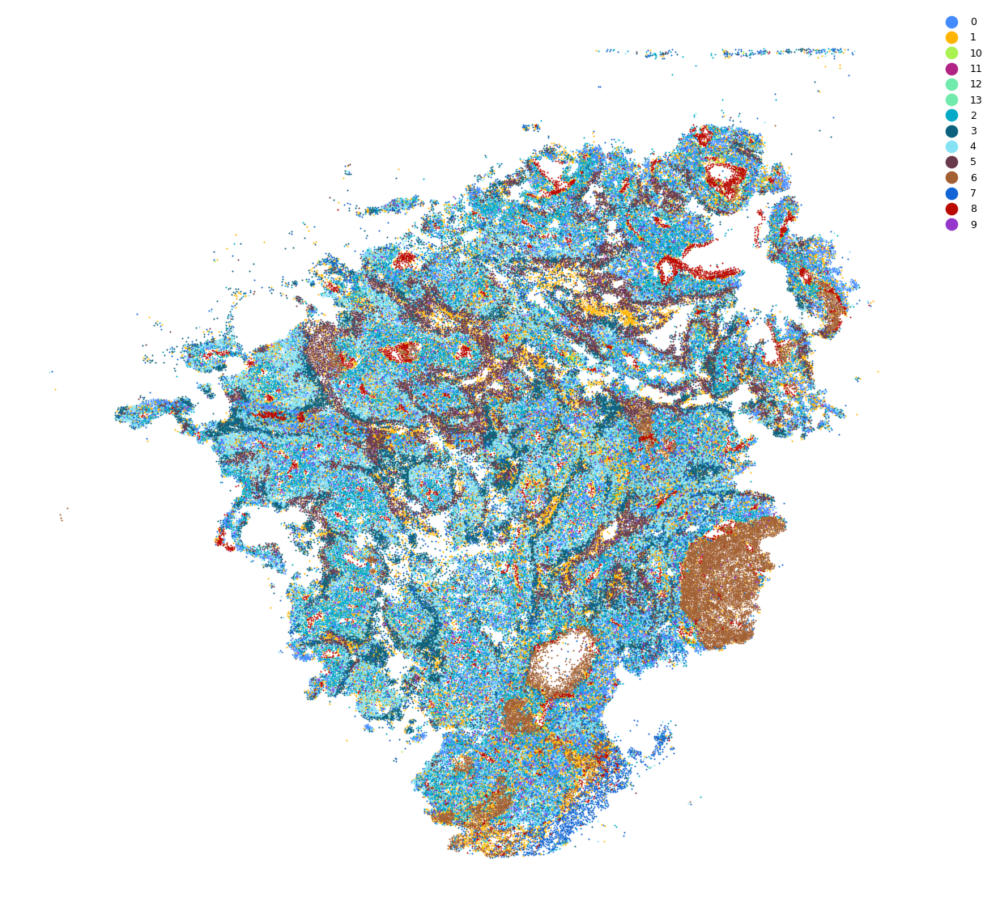

In [56]:
fig = plt.figure(None, (45, 11))
colors = M99_colors

with loompy.connect(M99,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_0_sel)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_0_sel == a)
        ax.scatter(ds.ca.x_centroid[ix], ds.ca.y_centroid[ix], c=colors[i], 
                    s=2.1, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.22, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_0_sel)
    labels = np.unique(ds.ca.leiden_1_0_sel)
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [62]:
M73_colors = ['#a6b79e','#ffb500','#448BFF','#8fb0ff','#85E3F4','#0c617c','#ba0900','#265B35',
              '#0c617c','#AAF250','#9437CA','#448BFF','#1265d6','#F0E408','#B12484','#090909','#1265d6',
              '#8fb0ff','#8fb0ff','#6a3a4c','#85E3F4','#02aac7','#85E3F4','#0c617c']

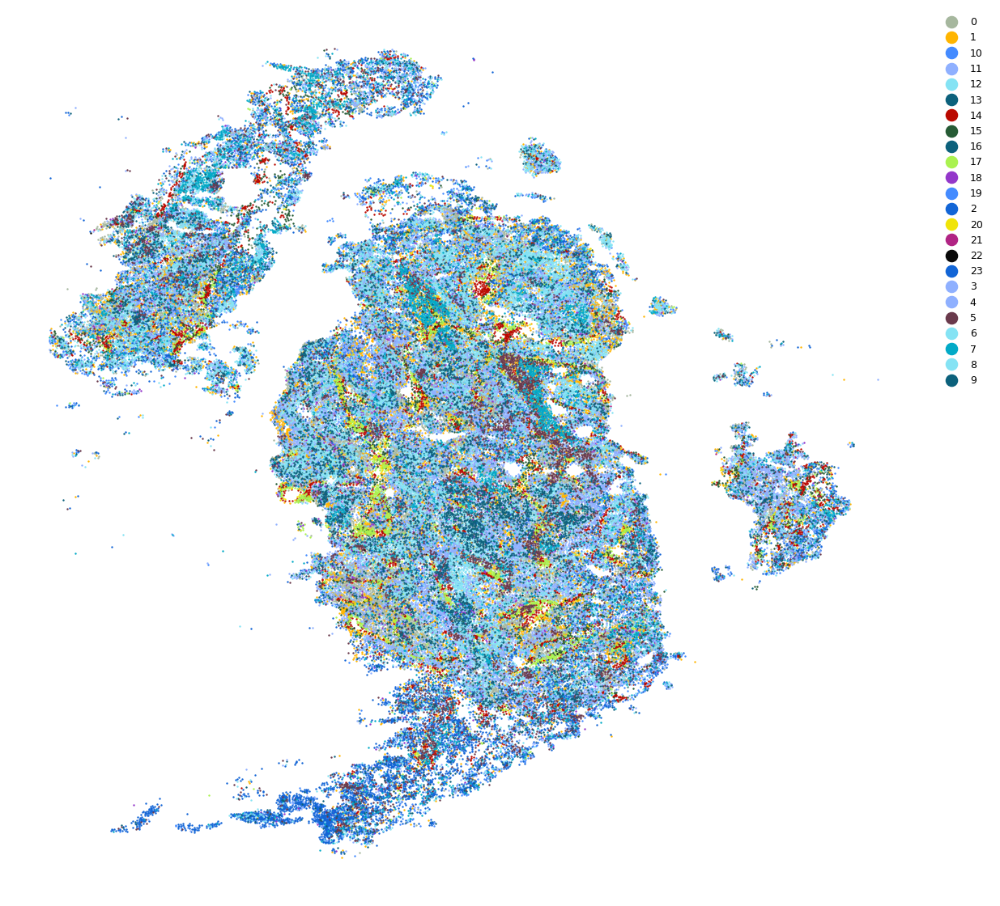

In [63]:
fig = plt.figure(None, (45, 11))
colors = M73_colors

with loompy.connect(M73,'r') as ds:

    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_5_sel)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_5_sel[ds.ca.replicate =='M73b'] == a)
        ax.scatter(ds.ca.x_centroid[ds.ca.replicate =='M73b'][ix], ds.ca.y_centroid[ds.ca.replicate =='M73b'][ix], c=colors[i], 
                    s=3, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.22, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_5_sel[ds.ca.replicate =='M73b'])
    labels = np.unique(ds.ca.leiden_1_5_sel[ds.ca.replicate =='M73b'])
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [64]:
M89_colors = ['#d5a6bd','#9437CA','#ba0900','#1265D6','#6a329f','#8fb0ff','#8fb0ff','#6a329f',
              '#8fb0ff','#265B35','#6a329f','#AAF250',
              '#8fb0ff','#bcbcbc','#71EBAB','#bcbcbc','#e2549a','#bcbcbc','#ba0900',
              '#6a329f','#9437CA','#8fb0ff','#1265D6','#8fb0ff','#ffb500','#8fb0ff']

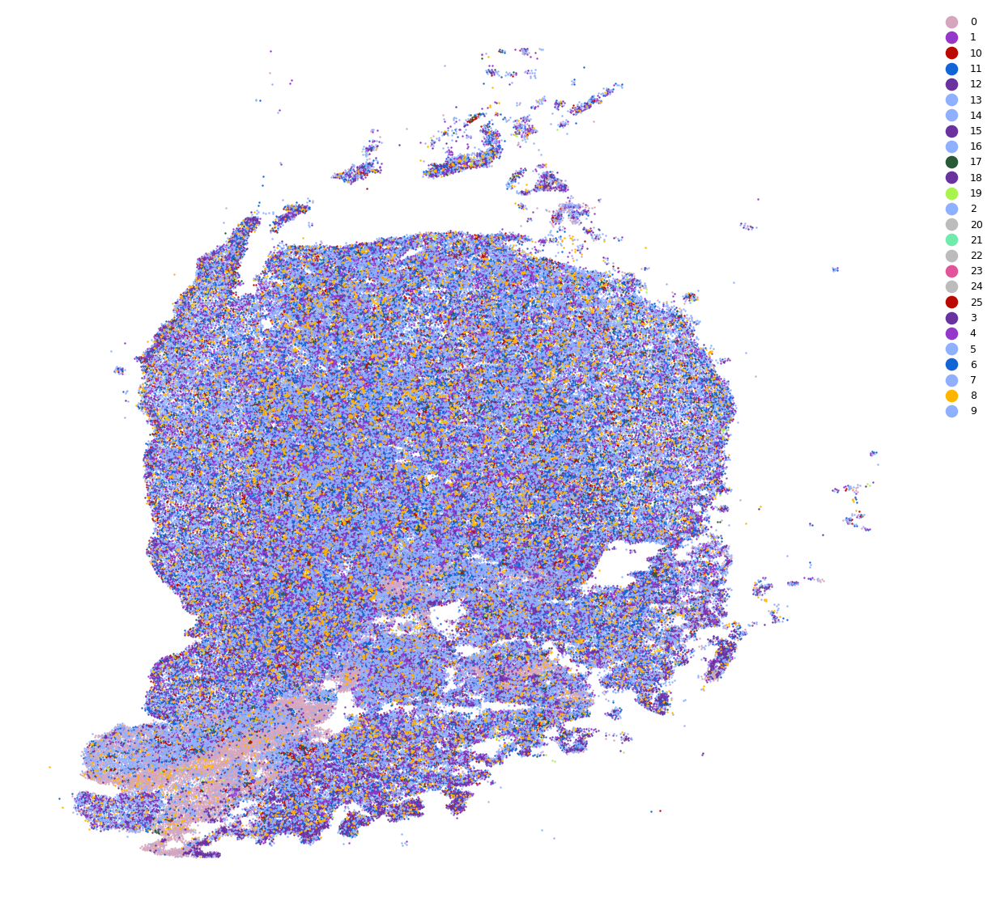

In [65]:
fig = plt.figure(None, (45, 11))
colors = M89_colors

with loompy.connect(M89,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_5_sel)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_5_sel[ds.ca.replicate =='M89b'] == a)
        ax.scatter(ds.ca.x_centroid[ds.ca.replicate =='M89b'][ix], ds.ca.y_centroid[ds.ca.replicate =='M89b'][ix], c=colors[i], 
                    s=3, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.22, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_5_sel[ds.ca.replicate =='M89b'])
    labels = np.unique(ds.ca.leiden_1_5_sel[ds.ca.replicate =='M89b'])
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [66]:
M46_colors2 = ['#00D179', '#9437CA', '#0c617c', '#84b2bf', '#75B8B4', '#02aac7', '#85E3F4', '#ffb500',
              '#AAF250', '#ba0900']

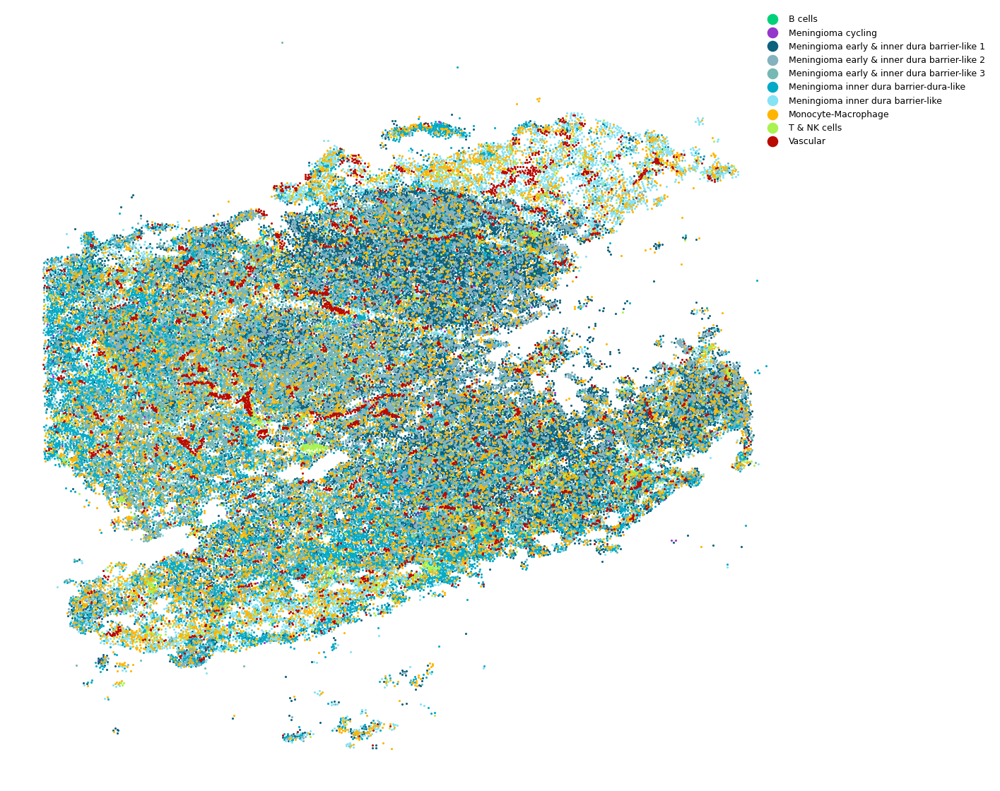

In [67]:
fig = plt.figure(None, (45, 11))
colors = M46_colors2

with loompy.connect(M46,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.ClusterText)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.ClusterText == a)
        ax.scatter(ds.ca.x_centroid[ix], ds.ca.y_centroid[ix], c=colors[i], 
                    s=5, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.26, 0, 0.05, 1])
    names = np.unique(ds.ca.ClusterText)
    labels = np.unique(ds.ca.ClusterText)
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [68]:
M47_colors = ['#A26033','#6a329f','#ba0900','#2145D4','#bcbcbc','#bcbcbc','#bcbcbc','#6a3a4c','#9437CA','#ffb500','#9437CA']

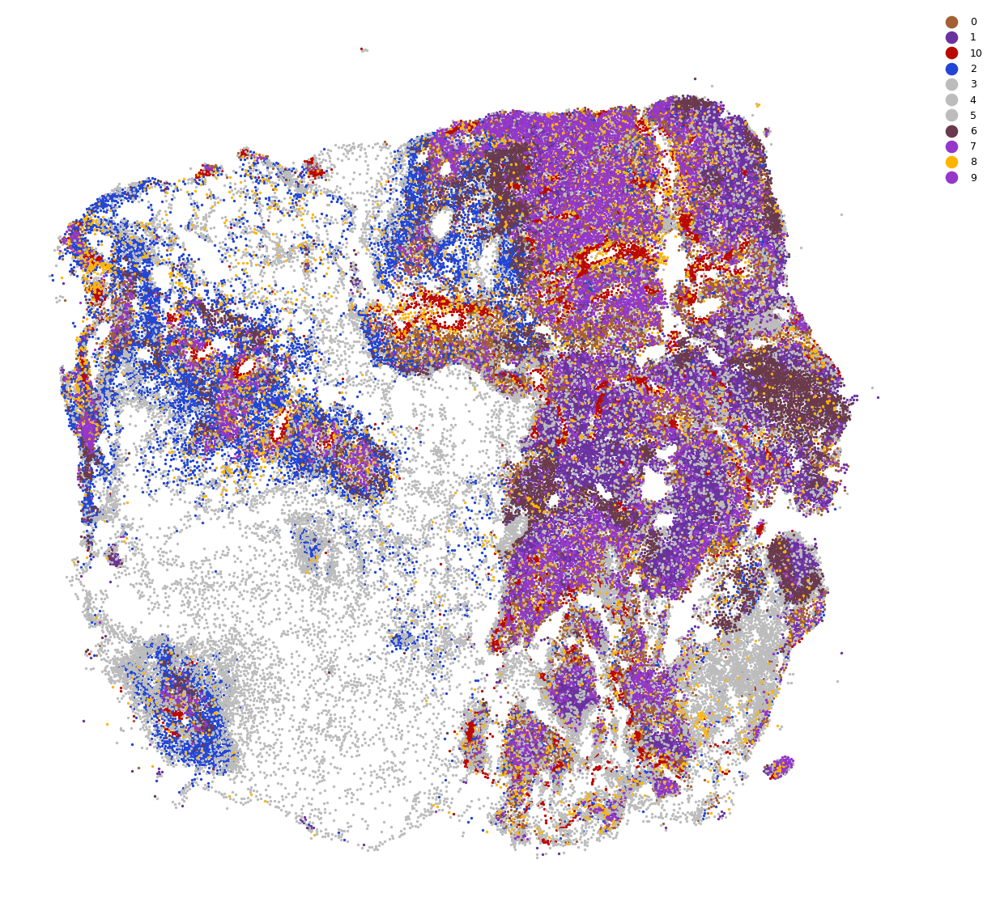

In [69]:
fig = plt.figure(None, (45, 11))
colors = M47_colors

with loompy.connect(M47,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_0)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_0 == a)
        ax.scatter(ds.ca.x_centroid[ix], ds.ca.y_centroid[ix], c=colors[i], 
                    s=6, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.22, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_0)
    labels = np.unique(ds.ca.leiden_1_0)
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [70]:
M108_colors = ['#85E3F4','#0c617c','#85E3F4','#2145D4','#0c617c','#D4B821','#ba0900','#ffb500','#0c617c']

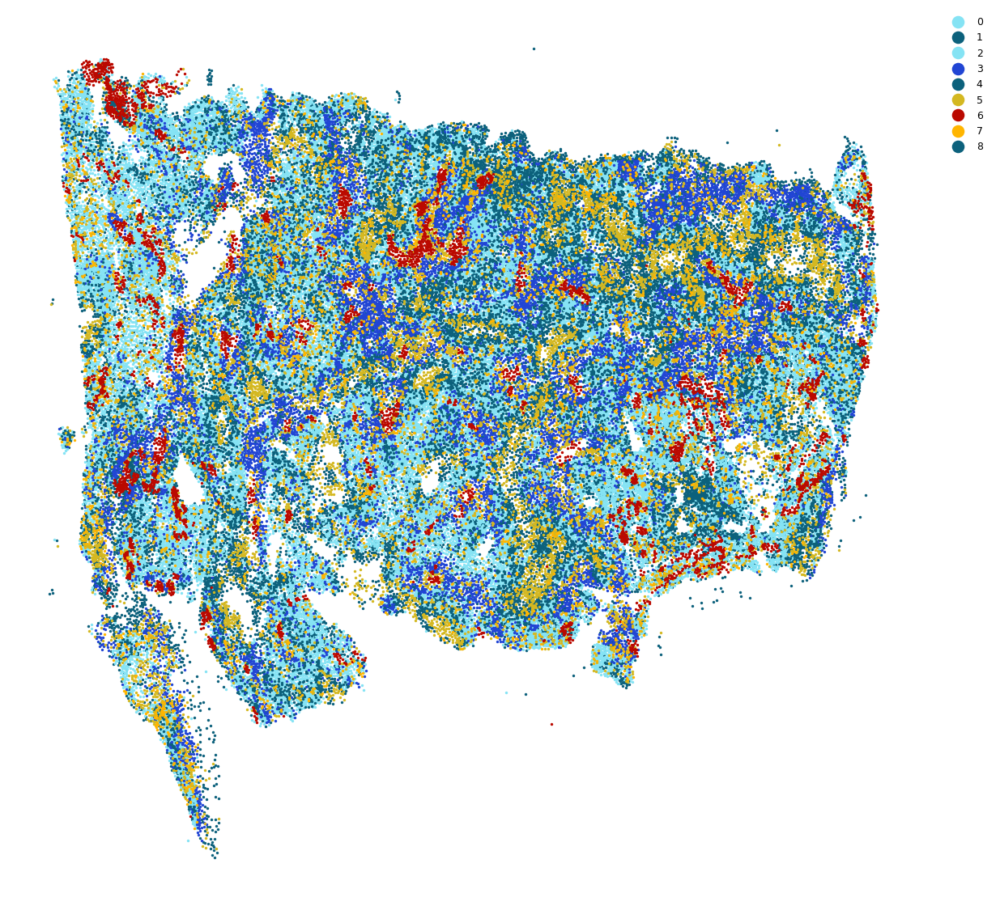

In [71]:
fig = plt.figure(None, (45, 11))
colors = M108_colors

with loompy.connect(M108,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_0)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_0 == a)
        ax.scatter(ds.ca.x_centroid[ix], ds.ca.y_centroid[ix], c=colors[i], 
                    s=6, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.22, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_0)
    labels = np.unique(ds.ca.leiden_1_0)
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [72]:
SL123_colors = ['#85E3F4','#0c617c','#8fb0ff','#448BFF','#ba0900','#ffb500','#265B35']

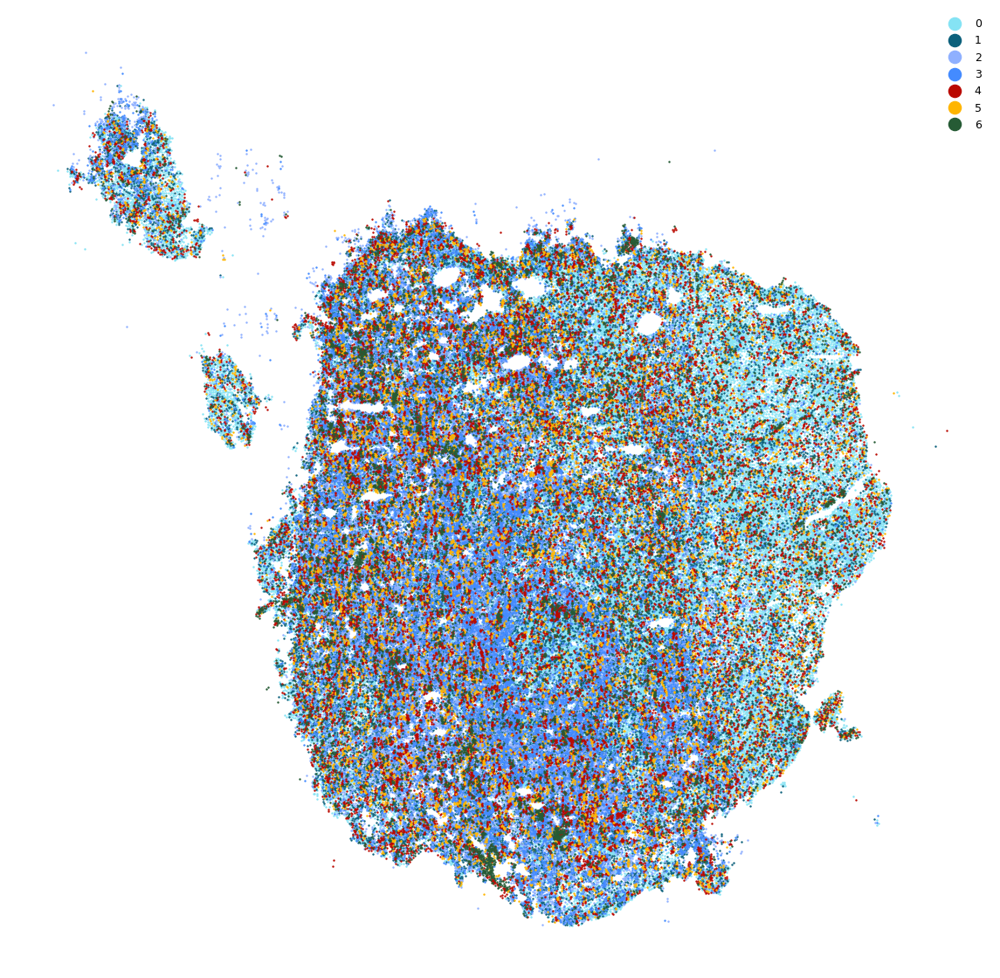

In [73]:
fig = plt.figure(None, (45, 11))
colors = SL123_colors

with loompy.connect(SL123,'r') as ds:
    
    ax = fig.add_axes([0, 0, 0.25, 1])
    ClassAnn = np.unique(ds.ca.leiden_1_0)
    for i,a in enumerate(ClassAnn):
        ix = (ds.ca.leiden_1_0[ds.ca.sample =='output-XETG00045__0014107__SL123__20240508__113334'] == a)
        ax.scatter(ds.ca.x_centroid[ds.ca.sample =='output-XETG00045__0014107__SL123__20240508__113334'][ix], ds.ca.y_centroid[ds.ca.sample =='output-XETG00045__0014107__SL123__20240508__113334'][ix], c=colors[i], 
                    s=3, lw=0, rasterized=True)
        ax.axis('off')
    
    ax2 = fig.add_axes([0.2, 0, 0.05, 1])
    names = np.unique(ds.ca.leiden_1_0[ds.ca.sample =='output-XETG00045__0014107__SL123__20240508__113334'])
    labels = np.unique(ds.ca.leiden_1_0[ds.ca.sample =='output-XETG00045__0014107__SL123__20240508__113334'])
    h = lambda c: plt.Line2D([], [], color=c, ls="", marker="o")
    ax2.legend(
		handles=[h(colors[i]) for i in range(len(names))],
		labels=list(names),
		loc='upper right',
		markerscale=1.7,
		frameon=False,
		fontsize=9)
    ax2.axis('off')

In [36]:
from cytograph.visualization import scatterm
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

def cmap_map(function, cmap):
    """ Applies function (which should operate on vectors of shape 3: [r, g, b]), on colormap cmap.
    This routine will break any discontinuous points in a colormap.
    """
    cdict = cmap._segmentdata
    step_dict = {}
    # Firt get the list of points where the segments start or end
    for key in ('red', 'green', 'blue'):
        step_dict[key] = list(map(lambda x: x[0], cdict[key]))
    step_list = sum(step_dict.values(), [])
    step_list = np.array(list(set(step_list)))
    # Then compute the LUT, and apply the function to the LUT
    reduced_cmap = lambda step : np.array(cmap(step)[0:3])
    old_LUT = np.array(list(map(reduced_cmap, step_list)))
    new_LUT = np.array(list(map(function, old_LUT)))
    # Now try to make a minimal segment definition of the new LUT
    cdict = {}
    for i, key in enumerate(['red','green','blue']):
        this_cdict = {}
        for j, step in enumerate(step_list):
            if step in step_dict[key]:
                this_cdict[step] = new_LUT[j, i]
            elif new_LUT[j,i] != old_LUT[j, i]:
                this_cdict[step] = new_LUT[j, i]
        colorvector = list(map(lambda x: x + (x[1], ), this_cdict.items()))
        colorvector.sort()
        cdict[key] = colorvector

    return matplotlib.colors.LinearSegmentedColormap('colormap',cdict,1024)

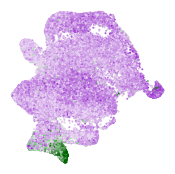

In [39]:
with loompy.connect(fetal_FBPC,'r') as ds:
    genes = ["FOXC1", "CSPG4", "ACTA2"]
    plt.figure(None, (2, 2))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'limegreen', 'darkgreen'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=2,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

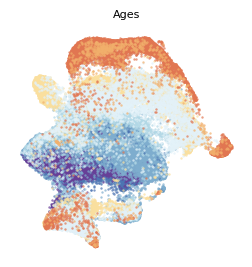

In [41]:
colors = ['#7EADCE','#4D74B2','#4D74B2','#683F97','#7EADCE','#B2D8E6','#FADF9E','#E3F2F9','#E3F2F9','#E17651','#F2B06C'] 
Age = ['7.5w','6.6w','6.7w','5.5w','7.6w','8.4w','10w','9w','9.9w','13.5w','12w']

plt.figure(None, (3,3))
with loompy.connect(fetal_FBPC, 'r') as ds:

    for i,a in enumerate(Age):
        exp = ds.ca.Agetext
        ix = (ds.ca.Agetext == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], alpha = 0.7, lw=0, s=3, rasterized=True)
        plt.axis('off')
        plt.title('Ages',fontsize=8)

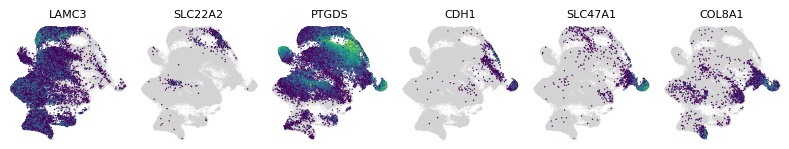

In [35]:
with loompy.connect(fetal_FBPC, 'r') as ds:
    plt.figure(None, (8, 8), facecolor='white')
    gs = plt.GridSpec(6, 6)

    to_plot = ['LAMC3','SLC22A2','PTGDS','CDH1','SLC47A1','COL8A1']

    for i, g in enumerate(to_plot):
        plt.subplot(gs[i])
        exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
        exp_cells = exp > 1
        plt.scatter(ds.ca.UMAP[:, 0], ds.ca.UMAP[:, 1], color='lightgrey', alpha=0.3, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.UMAP[exp_cells, 0], ds.ca.UMAP[exp_cells, 1], c=exp[exp_cells], s=1, lw=0, rasterized=True)
        plt.axis('off')
        plt.title(g, fontsize=8)
        plt.margins(0.0, 0.0)
        plt.tight_layout()
    plt.show()

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

gs = ['PECAM1', 'PTPRC', 'LAMC3', 'SLC22A6', 'SLC7A11',
      'PTGDS', 'CDH1', 'CCN3', 'SLC47A1', 'KCNMA1', 'COL8A1', 'MFAP5', 'COL2A1', 'HHIP',
      'TOP2A']

/home/peter/miniconda3/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/home/peter/miniconda3/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/home/peter/miniconda3/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/home/peter/miniconda3/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_mtx from `anndata` is deprecated. Import anndata.io.read_mtx instead.
  warnings.warn(msg, FutureWarning)
/home/peter/miniconda3/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.

/home/peter/miniconda3/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


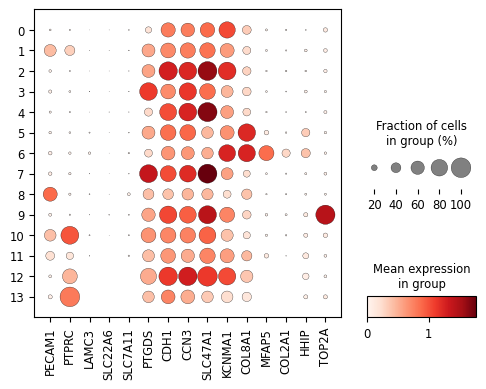

In [3]:
loomdata = sc.read_loom('Xenium_meningioma_M99.loom')
sc.pl.dotplot(loomdata, gs, groupby='leiden_1_0_sel', figsize=(5.7, 4))

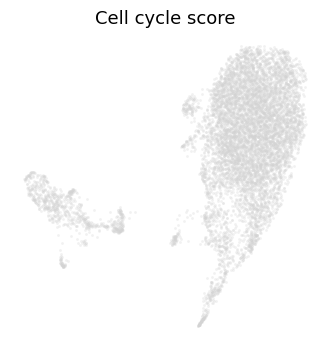

In [75]:
plt.figure(None, (4, 4))
with loompy.connect(fibroblasts_adult, 'r') as ds:

    exp = ds.ca.CellCycle
    ix = exp > 0.01
    plt.scatter(ds.ca.UMAP[:, 0], ds.ca.UMAP[:, 1], c='lightgrey', alpha = 0.3, lw=0, s=4)
    plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=exp[ix], cmap='magma', lw=0, s=4)
    plt.axis('off')
    plt.title('Cell cycle score',fontsize=13)

# Figure 7

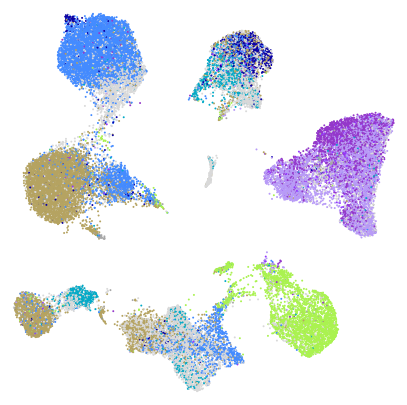

In [4]:
plt.figure(None, (5, 5))

class_color = {
    'Active monocytes': '#A8A8A8',
    'CD163 monocytes': '#A8A8A8',
    'CD4 T cells': '#A8A8A8',
    'CD8 T cells': '#A8A8A8',
    'Cycling G2M phase meningioma cells 1': '#9437FF',
    'Cycling G2M phase meningioma cells 2': '#9437CA',
    'Cycling S phase meningioma cells': '#B89BF7',
    'ECM remodeling meningioma cells': '#448BFF',
    'Excluded': '#D9D9D9',
    'G1 phase meningioma cells': '#B5A361',
    'Glia': '#A8A8A8',
    'Meningioma cells': '#02aac7',
    'Monocytes': '#A8A8A8',
    'Pericytes': '#AAF250',
    'SSTR2A meningioma cells': '#0900A5',
    'Vascular cells': '#A8A8A8'
}

with loompy.connect(meningioma_FBPC, 'r') as ds:

    # color by donor
    labels = np.array([class_color[x] for x in ds.ca.Choudhury_ClusterName])
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.UMAP[cells, 0], ds.ca.UMAP[cells, 1], c=labels[cells], s=2, lw=0, rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')
    #plt.savefig('/choudh_clustername_colours.png', dpi=300)

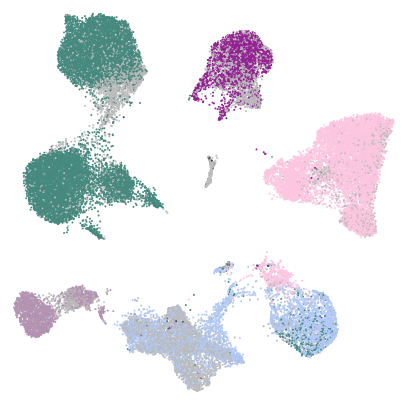

In [5]:
plt.figure(None, (5, 5))

class_color = {
    'Excluded': '#BBBBBB',
    'msc1': '#B392B2',
    'msc2': '#333F50',
    'msc3': '#942193',
    'msc4': '#B1C9F7',
    'msc4dura': '#B1C9F7',
    'msc5': '#46897E',
    'msc5bti': '#46897E',
    'msc5dura': '#46897E',
    'msc6': '#FCC6E0',
    'msc6bti': '#FCC6E0'
}

with loompy.connect(meningioma_FBPC, 'r') as ds:

    # color by donor
    labels = np.array([class_color[x] for x in ds.ca.Choudhury_Source])
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.UMAP[cells, 0], ds.ca.UMAP[cells, 1], c=labels[cells], s=2, lw=0, rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')

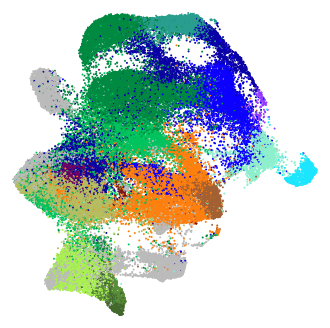

In [7]:
plt.figure(None, (4, 4))

class_color = {
    'Arachnoid': '#0900A5',
    'Arachnoid barrier': '#9437FF',
    'Arachnoid-Dura': '#3399FF',
    'ChP Committed arachnoid precursor': '#BBBBBB',
    'ChP Fibroblast': '#BBBBBB',
    'ChP Fibrocyte-like': '#BBBBBB',
    'ChP Meningeal fibroblast': '#BBBBBB',
    'ChP Pericyte': '#BBBBBB',
    'ChP Perivascular': '#BBBBBB',
    'Chondrocyte': '#BBBBBB',
    'Chondrogenic': '#FF7F0F',
    'Committed arachnoid precursor': '#0C00FF',
    'Committed arachnoid precursor-pia junction': '#299E8E',
    'Committed dura precursor': '#8DEFCC',
    'Committed pia precursor': '#00C35E',
    'Dura': '#1CE6FF',
    'Fibroblast-TAGAP': '#BBBBBB',
    'Hindbrain': '#6f0062',
    'Monocyte-fibrocyte': '#BBBBBB',
    'Osteogenic': '#A26033',
    'Osteoprogenitor': '#7A1911',
    'Pericyte': '#AAF250',
    'Perivascular fibroblast': '#BBBBBB',
    'Pia': '#008941',
    'Primary meninx': '#B5BE61',
    'Smooth muscle cell': '#598C39',
    'Smooth muscle cell, mature': '#42682B'
}

with loompy.connect(fetal_FBPC, 'r') as ds:

    # color by donor
    labels = np.array([class_color[x] for x in ds.ca.Subclass])
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.UMAP[cells, 0], ds.ca.UMAP[cells, 1], c=labels[cells], s=2, lw=0, rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')

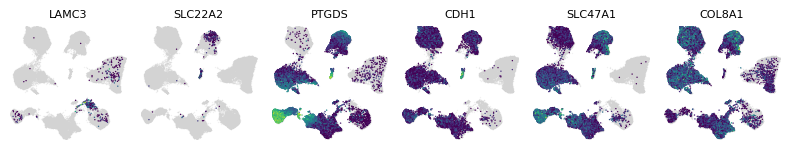

In [18]:
with loompy.connect(meningioma_FBPC, 'r') as ds:
    plt.figure(None, (8, 8), facecolor='white')
    gs = plt.GridSpec(6, 6)

    to_plot = ['LAMC3','SLC22A2','PTGDS','CDH1','SLC47A1','COL8A1']

    for i, g in enumerate(to_plot):
        plt.subplot(gs[i])
        exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
        exp_cells = exp > 1
        plt.scatter(ds.ca.UMAP[:, 0], ds.ca.UMAP[:, 1], color='lightgrey', alpha=0.3, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.UMAP[exp_cells, 0], ds.ca.UMAP[exp_cells, 1], c=exp[exp_cells], s=1, lw=0, rasterized=True)
        plt.axis('off')
        plt.title(g, fontsize=8)
        plt.margins(0.0, 0.0)
        plt.tight_layout()
    plt.show()

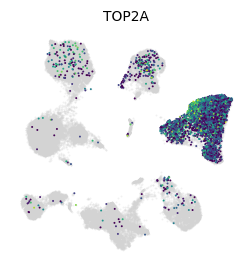

In [19]:
with loompy.connect(meningioma_FBPC, 'r') as ds:

    plt.figure(None, (3, 3))
    
    exp = np.log(ds[np.where(ds.ra.Gene == 'TOP2A')[0], :].flatten() +1) 
    ix = exp > 1 
    plt.scatter(ds.ca.UMAP[:, 0], ds.ca.UMAP[:, 1], c='lightgrey', alpha=0.30, lw=0,s=2)
    plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=exp[ix], cmap='viridis', lw=0, s=2)
    plt.axis('off')
    plt.title('TOP2A', fontsize=10) 

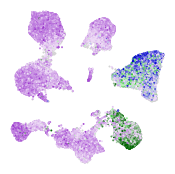

In [40]:
with loompy.connect(meningioma_FBPC,'r') as ds:
    genes = ["FOXC1", "CSPG4", "ACTA2","FOXM1"]
    plt.figure(None, (2, 2))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'limegreen', 'darkgreen','mediumblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=2,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

In [21]:
from cytograph.visualization import scatterm
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

def cmap_map(function, cmap):
    """ Applies function (which should operate on vectors of shape 3: [r, g, b]), on colormap cmap.
    This routine will break any discontinuous points in a colormap.
    """
    cdict = cmap._segmentdata
    step_dict = {}
    # Firt get the list of points where the segments start or end
    for key in ('red', 'green', 'blue'):
        step_dict[key] = list(map(lambda x: x[0], cdict[key]))
    step_list = sum(step_dict.values(), [])
    step_list = np.array(list(set(step_list)))
    # Then compute the LUT, and apply the function to the LUT
    reduced_cmap = lambda step : np.array(cmap(step)[0:3])
    old_LUT = np.array(list(map(reduced_cmap, step_list)))
    new_LUT = np.array(list(map(function, old_LUT)))
    # Now try to make a minimal segment definition of the new LUT
    cdict = {}
    for i, key in enumerate(['red','green','blue']):
        this_cdict = {}
        for j, step in enumerate(step_list):
            if step in step_dict[key]:
                this_cdict[step] = new_LUT[j, i]
            elif new_LUT[j,i] != old_LUT[j, i]:
                this_cdict[step] = new_LUT[j, i]
        colorvector = list(map(lambda x: x + (x[1], ), this_cdict.items()))
        colorvector.sort()
        cdict[key] = colorvector

    return matplotlib.colors.LinearSegmentedColormap('colormap',cdict,1024)

/Users/elin.vinsland/adult-human-brain/cytograph/decomposition/HPF_accel.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def compute_y_phi_batch(y_phi, start, u_logdiff, i_logdiff, u, i, y):  # type: ignore
/opt/anaconda3/envs/cgenv/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/anaconda3/

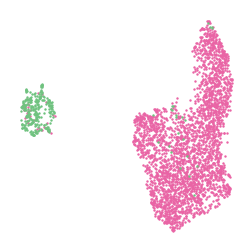

In [22]:
colors = ['#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#6FC27F'] #,'#B0558D'
karyo = range(0,14)

plt.figure(None, (3,3))
with loompy.connect(MSC1,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=3, lw=0)
        plt.axis('off')
    #plt.savefig('/karyo/MSC1.pdf',dpi=300)

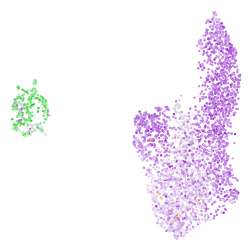

In [23]:
with loompy.connect(MSC1,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=3,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

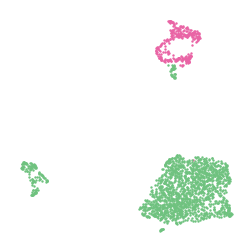

In [24]:
colors = ['#E964A5','#E964A5','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F'] #,'#B0558D'
karyo = range(0,13)

plt.figure(None, (3,3))
with loompy.connect(MSC2,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=3, lw=0)
        plt.axis('off')

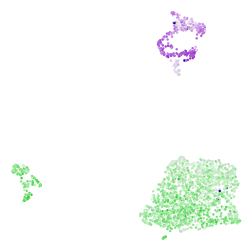

In [25]:
with loompy.connect(MSC2,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=3,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

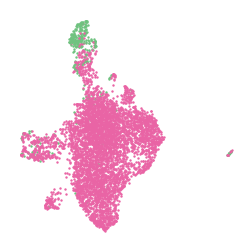

In [26]:
colors = ['#E964A5','#E964A5','#6FC27F','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5'] #,'#B0558D'
karyo = range(0,14)

plt.figure(None, (3,3))
with loompy.connect(MSC3,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=3, lw=0)
        plt.axis('off')

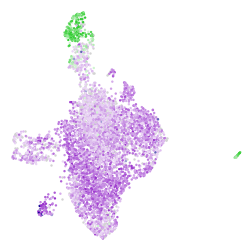

In [27]:
with loompy.connect(MSC3,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=3,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

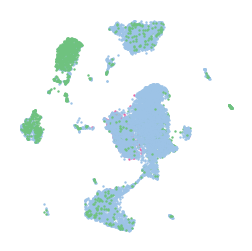

In [28]:
colors = ['#E964A5','#9DC3E6','#6FC27F','#9DC3E6','#9DC3E6','#9DC3E6','#9DC3E6','#9DC3E6','#9DC3E6',
          '#9DC3E6','#9DC3E6','#9DC3E6','#9DC3E6','#6FC27F','#6FC27F','#6FC27F'] #,'#B0558D'
karyo = range(0,14)

plt.figure(None, (3,3))
with loompy.connect(MSC4,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=3, lw=0)
        plt.axis('off')

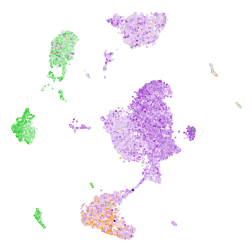

In [29]:
with loompy.connect(MSC4,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=2,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

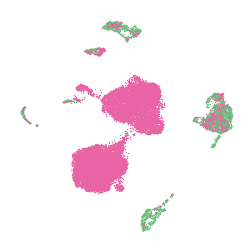

In [30]:
colors = ['#6FC27F','#6FC27F','#6FC27F','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5'] #,'#B0558D'
karyo = range(0,15)

plt.figure(None, (3,3))
with loompy.connect(MSC5,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=1, lw=0)
        plt.axis('off')

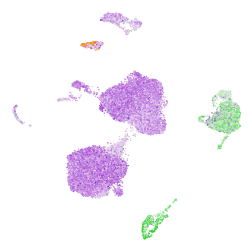

In [31]:
with loompy.connect(MSC5,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=1,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

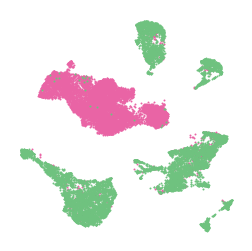

In [32]:
colors = ['#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#E964A5','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F','#6FC27F'] #,'#B0558D'
karyo = range(0,15)

plt.figure(None, (3,3))
with loompy.connect(MSC6,'r') as ds:

    for i,a in enumerate(karyo):
        ix = (ds.ca.Karyotype == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=2, lw=0)
        plt.axis('off')

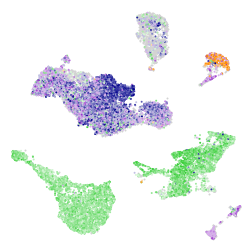

In [33]:
with loompy.connect(MSC6,'r') as ds:
    genes = ["FOXC1", "SLC38A11", "PTPRC",'FOXM1']
    plt.figure(None, (3, 3))
    scatterm(
        ds.ca.UMAP, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=['darkorchid', 'darkorange', 'limegreen','darkblue'],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=2,
        max_percentile=99.7,
        legend=None
    )
    plt.margins(0.01, 0.01)
    plt.axis('off')

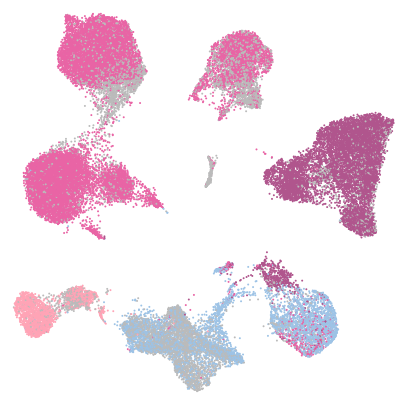

In [11]:
plt.figure(None, (5, 5))

class_color = {
    'Excluded': '#BBBBBB',
    'msc1': '#FFA4B6',
    'msc2': '#E964A5',
    'msc3': '#E964A5',
    'msc4': '#9DC3E6',
    'msc4dura': '#9DC3E6',
    'msc5': '#E964A5',
    'msc5bti': '#E964A5',
    'msc5dura': '#E964A5',
    'msc6': '#B0558D',
    'msc6bti': '#B0558D'
}

with loompy.connect(meningioma_FBPC, 'r') as ds:

    # color by donor
    labels = np.array([class_color[x] for x in ds.ca.Choudhury_Source])
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.UMAP[cells, 0], ds.ca.UMAP[cells, 1], c=labels[cells], s=2, lw=0, rasterized=True)
    plt.margins(0.01, 0.01)
    plt.axis('off')
    #plt.savefig('/choudh_karyo.png', dpi=300)

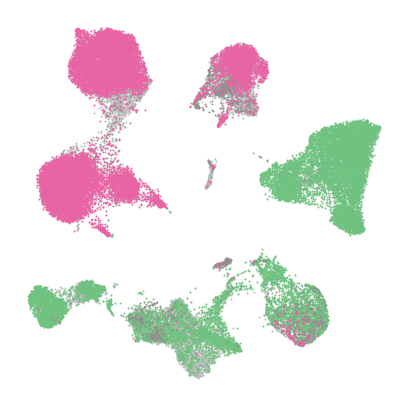

In [10]:
colors = ['#BBBBBB','#6FC27F','#909090','#E964A5']
chr22 = ['Excluded','nan','neutral','loss']

plt.figure(None, (5,5))
with loompy.connect(meningioma_FBPC, 'r') as ds:

    for i,a in enumerate(chr22):
        ix = (ds.ca.Choudhury_Chr22 == a)
        plt.scatter(ds.ca.UMAP[ix, 0], ds.ca.UMAP[ix, 1], c=colors[i], s=2, lw=0)
        plt.axis('off')
    #plt.savefig('/choudhury_chr22_colors.png',dpi=300)